# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor, Resize, Normalize

import tests

In [2]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [3]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [
        Resize(size),
        ToTensor(),
        Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ]
    
    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [4]:
import os

In [5]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        # TODO: implement the init method
        self.directory = directory
        self.transforms = transforms
        self.extension = extension
        self.image_paths = [
            os.path.join(directory, f) for f in os.listdir(directory)
            if f.endswith(extension)
        ]

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return len(self.image_paths) 

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        img_path = self.image_paths[index]
        img = Image.open(img_path)
        if self.transforms:
            img = self.transforms(img)
        return img 

In [6]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

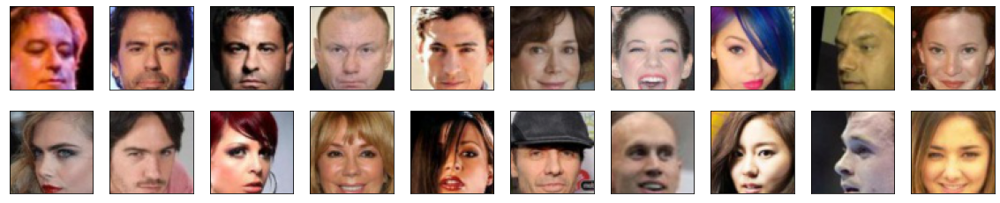

In [7]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [8]:
from torch.nn import Module, Conv2d, LeakyReLU, Flatten, Linear, Sigmoid

In [9]:
class Discriminator(Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        self.model = torch.nn.Sequential(
            Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            LeakyReLU(0.2, inplace=True),
            Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            LeakyReLU(0.2, inplace=True),
            Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            LeakyReLU(0.2, inplace=True),
            Conv2d(256, 512, kernel_size=4, stride=2, padding=1),
            LeakyReLU(0.2, inplace=True),
            Flatten()
            Linear(512 * 4 * 4, 1),
            Sigmoid()
        )
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        return self.model(x).view(-1, 1, 1, 1)

In [10]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


In [11]:
from torchinfo import summary

In [12]:
summary(discriminator, input_size=[1, 3, 64, 64])

Layer (type:depth-idx)                   Output Shape              Param #
Discriminator                            [1, 1, 1, 1]              --
├─Sequential: 1-1                        [1, 1]                    --
│    └─Conv2d: 2-1                       [1, 64, 32, 32]           3,136
│    └─LeakyReLU: 2-2                    [1, 64, 32, 32]           --
│    └─Conv2d: 2-3                       [1, 128, 16, 16]          131,200
│    └─LeakyReLU: 2-4                    [1, 128, 16, 16]          --
│    └─Conv2d: 2-5                       [1, 256, 8, 8]            524,544
│    └─LeakyReLU: 2-6                    [1, 256, 8, 8]            --
│    └─Conv2d: 2-7                       [1, 512, 4, 4]            2,097,664
│    └─LeakyReLU: 2-8                    [1, 512, 4, 4]            --
│    └─Flatten: 2-9                      [1, 8192]                 --
│    └─Linear: 2-10                      [1, 1]                    8,193
│    └─Sigmoid: 2-11                     [1, 1]               

### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [13]:
class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        self.model = torch.nn.Sequential(
            # Input: (latent_dim, 1, 1)
            torch.nn.ConvTranspose2d(latent_dim, 256, kernel_size=4, stride=1, padding=0),
            torch.nn.BatchNorm2d(256),
            torch.nn.ReLU(inplace=True),
            torch.nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            torch.nn.BatchNorm2d(128),
            torch.nn.ReLU(inplace=True),
            torch.nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            torch.nn.BatchNorm2d(64),
            torch.nn.ReLU(inplace=True),
            torch.nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            torch.nn.BatchNorm2d(32),
            torch.nn.ReLU(inplace=True),
            torch.nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),
            torch.nn.Tanh()
        )
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        return self.model(x)

In [14]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


In [15]:
summary(generator, input_size=[1, 128, 1, 1])

Layer (type:depth-idx)                   Output Shape              Param #
Generator                                [1, 3, 64, 64]            --
├─Sequential: 1-1                        [1, 3, 64, 64]            --
│    └─ConvTranspose2d: 2-1              [1, 256, 4, 4]            524,544
│    └─BatchNorm2d: 2-2                  [1, 256, 4, 4]            512
│    └─ReLU: 2-3                         [1, 256, 4, 4]            --
│    └─ConvTranspose2d: 2-4              [1, 128, 8, 8]            524,416
│    └─BatchNorm2d: 2-5                  [1, 128, 8, 8]            256
│    └─ReLU: 2-6                         [1, 128, 8, 8]            --
│    └─ConvTranspose2d: 2-7              [1, 64, 16, 16]           131,136
│    └─BatchNorm2d: 2-8                  [1, 64, 16, 16]           128
│    └─ReLU: 2-9                         [1, 64, 16, 16]           --
│    └─ConvTranspose2d: 2-10             [1, 32, 32, 32]           32,800
│    └─BatchNorm2d: 2-11                 [1, 32, 32, 32]       

## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [16]:
import torch.optim as optim


def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    g_optimizer = optim.Adam(generator.parameters(), lr=1e-4, betas=(0.5, 0.999))
    d_optimizer = optim.Adam(discriminator.parameters(), lr=1e-4, betas=(0.5, 0.999))
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [17]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss
    loss = torch.nn.functional.binary_cross_entropy(
        fake_logits, torch.ones_like(fake_logits)
    )
    return loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [18]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss
    real_loss = torch.nn.functional.binary_cross_entropy(real_logits, torch.ones_like(real_logits))
    fake_loss = torch.nn.functional.binary_cross_entropy(fake_logits, torch.zeros_like(fake_logits))
    loss = real_loss + fake_loss
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [19]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    batch_size = real_samples.size(0)
    epsilon = torch.rand(batch_size, 1, 1, 1, device=real_samples.device, requires_grad=True)
    interpolated_samples = epsilon * real_samples + (1 - epsilon) * fake_samples
    interpolated_samples.requires_grad_(True)

    interpolated_logits = discriminator(interpolated_samples)
    gradients = torch.autograd.grad(
        outputs=interpolated_logits,
        inputs=interpolated_samples,
        grad_outputs=torch.ones_like(interpolated_logits),
        create_graph=True,
        retain_graph=True,
        only_inputs=True
    )[0]

    gradients = gradients.view(batch_size, -1)
    gradient_norm = gradients.norm(2, dim=1)
    gp = ((gradient_norm - 1) ** 2).mean()
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [20]:
def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    generator.zero_grad()
    # Generate fake images
    latent_vector = torch.randn(batch_size, latent_dim, 1, 1, device=device)
    fake_images = generator(latent_vector)
    # Get discriminator's predictions for fake images
    fake_logits = discriminator(fake_images)
    # Calculate generator loss
    g_loss = generator_loss(fake_logits)
    # Backpropagation and optimizer step
    g_loss.backward()
    g_optimizer.step()
    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    # Ensure the batch size matches the size of real_images
    assert batch_size == real_images.size(0), "Batch size mismatch between real_images and input batch_size"

    discriminator.zero_grad()
    # Generate fake images
    latent_vector = torch.randn(batch_size, latent_dim, 1, 1, device=device)
    fake_images = generator(latent_vector).detach()
    # Get discriminator's predictions for real and fake images
    real_logits = discriminator(real_images)
    fake_logits = discriminator(fake_images)
    # Calculate gradient penalty
    gp = gradient_penalty(discriminator, real_images, fake_images)
    # Calculate discriminator loss with gradient penalty
    d_loss = discriminator_loss(real_logits, fake_logits) + 10 * gp  # 10 is the gradient penalty coefficient
    # Backpropagation and optimizer step
    d_loss.backward()
    d_optimizer.step()
    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [21]:
from datetime import datetime

In [22]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 30

# number of images in each batch
batch_size = 16

In [23]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [24]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2025-03-29 13:53:05 | Epoch [01/30] | Batch 000/509 | d_loss: 11.3117 | g_loss: 0.6976
2025-03-29 13:53:13 | Epoch [01/30] | Batch 050/509 | d_loss: 10.7860 | g_loss: 0.3839
2025-03-29 13:53:22 | Epoch [01/30] | Batch 100/509 | d_loss: 10.6559 | g_loss: 0.6885
2025-03-29 13:53:30 | Epoch [01/30] | Batch 150/509 | d_loss: 11.1844 | g_loss: 0.5198
2025-03-29 13:53:39 | Epoch [01/30] | Batch 200/509 | d_loss: 10.4268 | g_loss: 0.6669
2025-03-29 13:53:47 | Epoch [01/30] | Batch 250/509 | d_loss: 09.4338 | g_loss: 0.8281
2025-03-29 13:53:56 | Epoch [01/30] | Batch 300/509 | d_loss: 09.6706 | g_loss: 0.2825
2025-03-29 13:54:04 | Epoch [01/30] | Batch 350/509 | d_loss: 10.7250 | g_loss: 0.2400
2025-03-29 13:54:12 | Epoch [01/30] | Batch 400/509 | d_loss: 09.1757 | g_loss: 0.9662
2025-03-29 13:54:21 | Epoch [01/30] | Batch 450/509 | d_loss: 08.4112 | g_loss: 0.5899
2025-03-29 13:54:29 | Epoch [01/30] | Batch 500/509 | d_loss: 07.8378 | g_loss: 0.2689


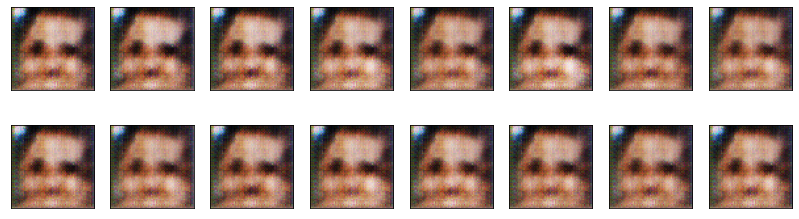

2025-03-29 13:54:34 | Epoch [02/30] | Batch 000/509 | d_loss: 08.4415 | g_loss: 0.7670
2025-03-29 13:54:42 | Epoch [02/30] | Batch 050/509 | d_loss: 07.1548 | g_loss: 0.1917
2025-03-29 13:54:51 | Epoch [02/30] | Batch 100/509 | d_loss: 07.3584 | g_loss: 0.2744
2025-03-29 13:54:59 | Epoch [02/30] | Batch 150/509 | d_loss: 06.7192 | g_loss: 0.6152
2025-03-29 13:55:08 | Epoch [02/30] | Batch 200/509 | d_loss: 05.9098 | g_loss: 0.3340
2025-03-29 13:55:16 | Epoch [02/30] | Batch 250/509 | d_loss: 05.3120 | g_loss: 0.5430
2025-03-29 13:55:24 | Epoch [02/30] | Batch 300/509 | d_loss: 05.2994 | g_loss: 0.6965
2025-03-29 13:55:33 | Epoch [02/30] | Batch 350/509 | d_loss: 04.4942 | g_loss: 0.5278
2025-03-29 13:55:41 | Epoch [02/30] | Batch 400/509 | d_loss: 04.4603 | g_loss: 0.7100
2025-03-29 13:55:49 | Epoch [02/30] | Batch 450/509 | d_loss: 04.0221 | g_loss: 0.6115
2025-03-29 13:55:58 | Epoch [02/30] | Batch 500/509 | d_loss: 03.5957 | g_loss: 0.4970


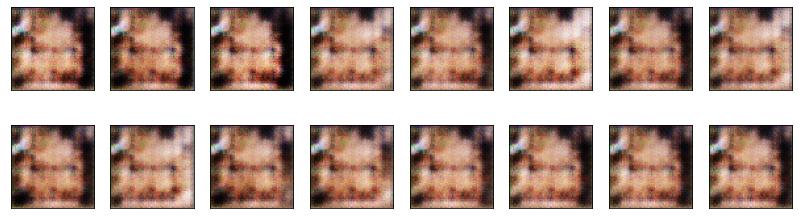

2025-03-29 13:56:03 | Epoch [03/30] | Batch 000/509 | d_loss: 03.5820 | g_loss: 0.6911
2025-03-29 13:56:11 | Epoch [03/30] | Batch 050/509 | d_loss: 04.8008 | g_loss: 0.4647
2025-03-29 13:56:19 | Epoch [03/30] | Batch 100/509 | d_loss: 04.0306 | g_loss: 0.4709
2025-03-29 13:56:28 | Epoch [03/30] | Batch 150/509 | d_loss: 03.7032 | g_loss: 0.7352
2025-03-29 13:56:36 | Epoch [03/30] | Batch 200/509 | d_loss: 04.4806 | g_loss: 0.6447
2025-03-29 13:56:45 | Epoch [03/30] | Batch 250/509 | d_loss: 03.8624 | g_loss: 0.6473
2025-03-29 13:56:53 | Epoch [03/30] | Batch 300/509 | d_loss: 03.7942 | g_loss: 0.3533
2025-03-29 13:57:01 | Epoch [03/30] | Batch 350/509 | d_loss: 03.6536 | g_loss: 0.6877
2025-03-29 13:57:10 | Epoch [03/30] | Batch 400/509 | d_loss: 03.3353 | g_loss: 0.2159
2025-03-29 13:57:18 | Epoch [03/30] | Batch 450/509 | d_loss: 04.7025 | g_loss: 0.5893
2025-03-29 13:57:26 | Epoch [03/30] | Batch 500/509 | d_loss: 04.0689 | g_loss: 0.2244


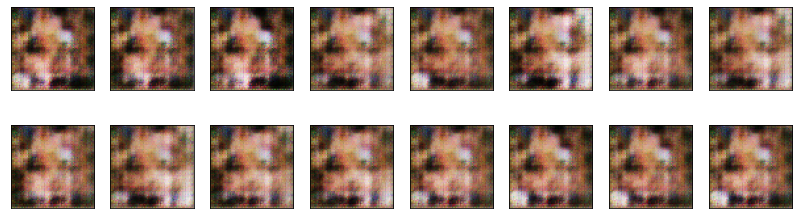

2025-03-29 13:57:32 | Epoch [04/30] | Batch 000/509 | d_loss: 02.3082 | g_loss: 0.6495
2025-03-29 13:57:40 | Epoch [04/30] | Batch 050/509 | d_loss: 02.8491 | g_loss: 0.4448
2025-03-29 13:57:48 | Epoch [04/30] | Batch 100/509 | d_loss: 02.4682 | g_loss: 0.6525
2025-03-29 13:57:57 | Epoch [04/30] | Batch 150/509 | d_loss: 03.4162 | g_loss: 0.8745
2025-03-29 13:58:05 | Epoch [04/30] | Batch 200/509 | d_loss: 04.8087 | g_loss: 0.6832
2025-03-29 13:58:13 | Epoch [04/30] | Batch 250/509 | d_loss: 02.8730 | g_loss: 0.5301
2025-03-29 13:58:22 | Epoch [04/30] | Batch 300/509 | d_loss: 02.5228 | g_loss: 0.3263
2025-03-29 13:58:30 | Epoch [04/30] | Batch 350/509 | d_loss: 02.5134 | g_loss: 0.4856
2025-03-29 13:58:39 | Epoch [04/30] | Batch 400/509 | d_loss: 02.8137 | g_loss: 0.4499
2025-03-29 13:58:47 | Epoch [04/30] | Batch 450/509 | d_loss: 02.7493 | g_loss: 0.4474
2025-03-29 13:58:55 | Epoch [04/30] | Batch 500/509 | d_loss: 02.2989 | g_loss: 0.6302


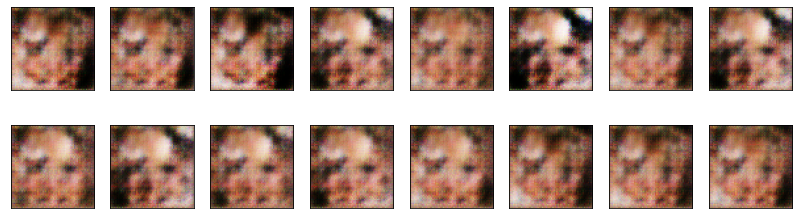

2025-03-29 13:59:00 | Epoch [05/30] | Batch 000/509 | d_loss: 02.8459 | g_loss: 0.3549
2025-03-29 13:59:09 | Epoch [05/30] | Batch 050/509 | d_loss: 02.4672 | g_loss: 0.5770
2025-03-29 13:59:17 | Epoch [05/30] | Batch 100/509 | d_loss: 02.6081 | g_loss: 0.3865
2025-03-29 13:59:25 | Epoch [05/30] | Batch 150/509 | d_loss: 03.7276 | g_loss: 0.2260
2025-03-29 13:59:34 | Epoch [05/30] | Batch 200/509 | d_loss: 03.2229 | g_loss: 0.5400
2025-03-29 13:59:42 | Epoch [05/30] | Batch 250/509 | d_loss: 03.3708 | g_loss: 0.3219
2025-03-29 13:59:50 | Epoch [05/30] | Batch 300/509 | d_loss: 03.3954 | g_loss: 0.8829
2025-03-29 13:59:59 | Epoch [05/30] | Batch 350/509 | d_loss: 02.9613 | g_loss: 0.3228
2025-03-29 14:00:07 | Epoch [05/30] | Batch 400/509 | d_loss: 02.8162 | g_loss: 0.4195
2025-03-29 14:00:16 | Epoch [05/30] | Batch 450/509 | d_loss: 03.0486 | g_loss: 0.5293
2025-03-29 14:00:24 | Epoch [05/30] | Batch 500/509 | d_loss: 02.8178 | g_loss: 0.3875


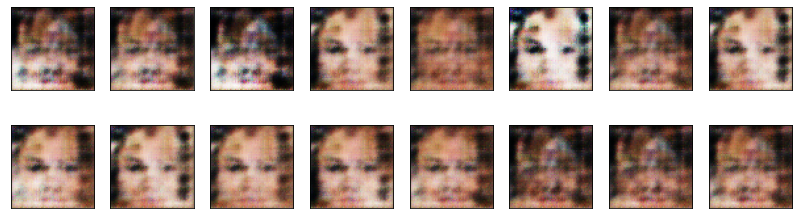

2025-03-29 14:00:30 | Epoch [06/30] | Batch 000/509 | d_loss: 03.3527 | g_loss: 0.3032
2025-03-29 14:00:38 | Epoch [06/30] | Batch 050/509 | d_loss: 03.0933 | g_loss: 0.5145
2025-03-29 14:00:46 | Epoch [06/30] | Batch 100/509 | d_loss: 02.6957 | g_loss: 0.4751
2025-03-29 14:00:55 | Epoch [06/30] | Batch 150/509 | d_loss: 02.7340 | g_loss: 0.6068
2025-03-29 14:01:03 | Epoch [06/30] | Batch 200/509 | d_loss: 03.1263 | g_loss: 0.3649
2025-03-29 14:01:12 | Epoch [06/30] | Batch 250/509 | d_loss: 02.4603 | g_loss: 0.4955
2025-03-29 14:01:20 | Epoch [06/30] | Batch 300/509 | d_loss: 02.7975 | g_loss: 0.3300
2025-03-29 14:01:28 | Epoch [06/30] | Batch 350/509 | d_loss: 02.8500 | g_loss: 0.8079
2025-03-29 14:01:37 | Epoch [06/30] | Batch 400/509 | d_loss: 02.8156 | g_loss: 0.5347
2025-03-29 14:01:45 | Epoch [06/30] | Batch 450/509 | d_loss: 02.7189 | g_loss: 0.4899
2025-03-29 14:01:53 | Epoch [06/30] | Batch 500/509 | d_loss: 02.8992 | g_loss: 0.3275


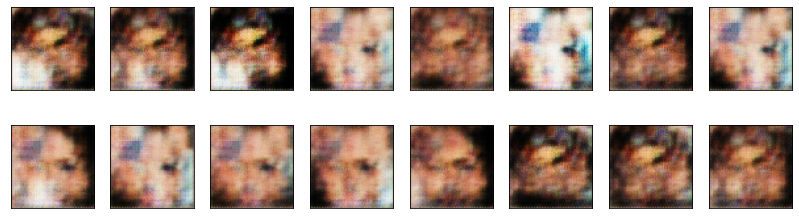

2025-03-29 14:01:58 | Epoch [07/30] | Batch 000/509 | d_loss: 03.0771 | g_loss: 0.6696
2025-03-29 14:02:07 | Epoch [07/30] | Batch 050/509 | d_loss: 02.1429 | g_loss: 0.4239
2025-03-29 14:02:15 | Epoch [07/30] | Batch 100/509 | d_loss: 02.2865 | g_loss: 0.4387
2025-03-29 14:02:23 | Epoch [07/30] | Batch 150/509 | d_loss: 02.7472 | g_loss: 0.5657
2025-03-29 14:02:32 | Epoch [07/30] | Batch 200/509 | d_loss: 02.3736 | g_loss: 0.5404
2025-03-29 14:02:40 | Epoch [07/30] | Batch 250/509 | d_loss: 02.4115 | g_loss: 0.3885
2025-03-29 14:02:49 | Epoch [07/30] | Batch 300/509 | d_loss: 02.5262 | g_loss: 0.4727
2025-03-29 14:02:57 | Epoch [07/30] | Batch 350/509 | d_loss: 02.3752 | g_loss: 0.4321
2025-03-29 14:03:05 | Epoch [07/30] | Batch 400/509 | d_loss: 02.4635 | g_loss: 0.5219
2025-03-29 14:03:14 | Epoch [07/30] | Batch 450/509 | d_loss: 02.3203 | g_loss: 0.4652
2025-03-29 14:03:22 | Epoch [07/30] | Batch 500/509 | d_loss: 02.4678 | g_loss: 0.6277


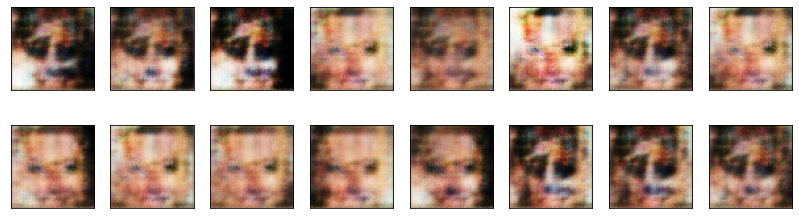

2025-03-29 14:03:28 | Epoch [08/30] | Batch 000/509 | d_loss: 02.2531 | g_loss: 0.4438
2025-03-29 14:03:36 | Epoch [08/30] | Batch 050/509 | d_loss: 02.2082 | g_loss: 0.4827
2025-03-29 14:03:44 | Epoch [08/30] | Batch 100/509 | d_loss: 02.4308 | g_loss: 0.3956
2025-03-29 14:03:53 | Epoch [08/30] | Batch 150/509 | d_loss: 02.1338 | g_loss: 0.6353
2025-03-29 14:04:01 | Epoch [08/30] | Batch 200/509 | d_loss: 02.2917 | g_loss: 0.4484
2025-03-29 14:04:09 | Epoch [08/30] | Batch 250/509 | d_loss: 02.7276 | g_loss: 0.2849
2025-03-29 14:04:18 | Epoch [08/30] | Batch 300/509 | d_loss: 02.1999 | g_loss: 0.5288
2025-03-29 14:04:26 | Epoch [08/30] | Batch 350/509 | d_loss: 02.4466 | g_loss: 0.4024
2025-03-29 14:04:35 | Epoch [08/30] | Batch 400/509 | d_loss: 02.2220 | g_loss: 0.7258
2025-03-29 14:04:43 | Epoch [08/30] | Batch 450/509 | d_loss: 02.4521 | g_loss: 0.4335
2025-03-29 14:04:51 | Epoch [08/30] | Batch 500/509 | d_loss: 02.3880 | g_loss: 0.8262


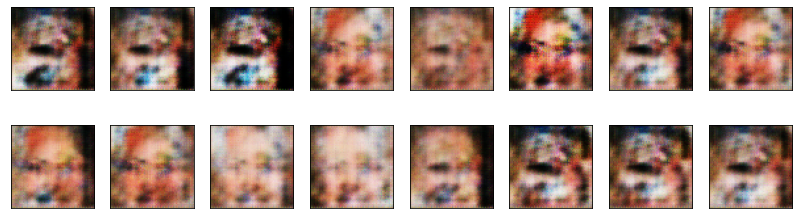

2025-03-29 14:04:56 | Epoch [09/30] | Batch 000/509 | d_loss: 02.1484 | g_loss: 0.5339
2025-03-29 14:05:04 | Epoch [09/30] | Batch 050/509 | d_loss: 02.6468 | g_loss: 1.0120
2025-03-29 14:05:13 | Epoch [09/30] | Batch 100/509 | d_loss: 02.1424 | g_loss: 0.4973
2025-03-29 14:05:21 | Epoch [09/30] | Batch 150/509 | d_loss: 01.9978 | g_loss: 0.6044
2025-03-29 14:05:29 | Epoch [09/30] | Batch 200/509 | d_loss: 02.1639 | g_loss: 0.4470
2025-03-29 14:05:38 | Epoch [09/30] | Batch 250/509 | d_loss: 03.0757 | g_loss: 0.4734
2025-03-29 14:05:46 | Epoch [09/30] | Batch 300/509 | d_loss: 02.1216 | g_loss: 0.4548
2025-03-29 14:05:54 | Epoch [09/30] | Batch 350/509 | d_loss: 02.0258 | g_loss: 0.5238
2025-03-29 14:06:03 | Epoch [09/30] | Batch 400/509 | d_loss: 02.0785 | g_loss: 0.5302
2025-03-29 14:06:11 | Epoch [09/30] | Batch 450/509 | d_loss: 02.1255 | g_loss: 0.4440
2025-03-29 14:06:19 | Epoch [09/30] | Batch 500/509 | d_loss: 01.9223 | g_loss: 0.6100


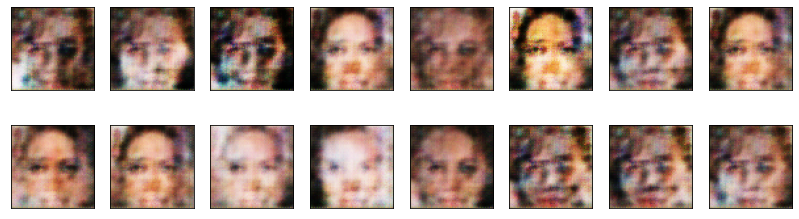

2025-03-29 14:06:25 | Epoch [10/30] | Batch 000/509 | d_loss: 02.1484 | g_loss: 0.4690
2025-03-29 14:06:33 | Epoch [10/30] | Batch 050/509 | d_loss: 02.0776 | g_loss: 0.4997
2025-03-29 14:06:42 | Epoch [10/30] | Batch 100/509 | d_loss: 01.9382 | g_loss: 0.5198
2025-03-29 14:06:50 | Epoch [10/30] | Batch 150/509 | d_loss: 02.2152 | g_loss: 0.5293
2025-03-29 14:06:58 | Epoch [10/30] | Batch 200/509 | d_loss: 02.0737 | g_loss: 0.5304
2025-03-29 14:07:07 | Epoch [10/30] | Batch 250/509 | d_loss: 02.1375 | g_loss: 0.3503
2025-03-29 14:07:15 | Epoch [10/30] | Batch 300/509 | d_loss: 02.2536 | g_loss: 0.5755
2025-03-29 14:07:23 | Epoch [10/30] | Batch 350/509 | d_loss: 01.8986 | g_loss: 0.4302
2025-03-29 14:07:32 | Epoch [10/30] | Batch 400/509 | d_loss: 02.0008 | g_loss: 0.5089
2025-03-29 14:07:40 | Epoch [10/30] | Batch 450/509 | d_loss: 02.1290 | g_loss: 0.5075
2025-03-29 14:07:48 | Epoch [10/30] | Batch 500/509 | d_loss: 02.5422 | g_loss: 0.5145


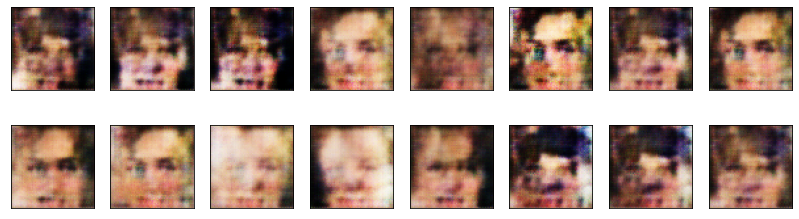

2025-03-29 14:07:53 | Epoch [11/30] | Batch 000/509 | d_loss: 02.0563 | g_loss: 0.6343
2025-03-29 14:08:01 | Epoch [11/30] | Batch 050/509 | d_loss: 02.1991 | g_loss: 0.5295
2025-03-29 14:08:10 | Epoch [11/30] | Batch 100/509 | d_loss: 02.0509 | g_loss: 0.7671
2025-03-29 14:08:18 | Epoch [11/30] | Batch 150/509 | d_loss: 01.9809 | g_loss: 0.5068
2025-03-29 14:08:26 | Epoch [11/30] | Batch 200/509 | d_loss: 01.8961 | g_loss: 0.5956
2025-03-29 14:08:35 | Epoch [11/30] | Batch 250/509 | d_loss: 02.0308 | g_loss: 0.5119
2025-03-29 14:08:43 | Epoch [11/30] | Batch 300/509 | d_loss: 01.9175 | g_loss: 0.4696
2025-03-29 14:08:51 | Epoch [11/30] | Batch 350/509 | d_loss: 02.2859 | g_loss: 0.5490
2025-03-29 14:09:00 | Epoch [11/30] | Batch 400/509 | d_loss: 01.9804 | g_loss: 0.3829
2025-03-29 14:09:08 | Epoch [11/30] | Batch 450/509 | d_loss: 02.0109 | g_loss: 0.5305
2025-03-29 14:09:16 | Epoch [11/30] | Batch 500/509 | d_loss: 01.9506 | g_loss: 0.5500


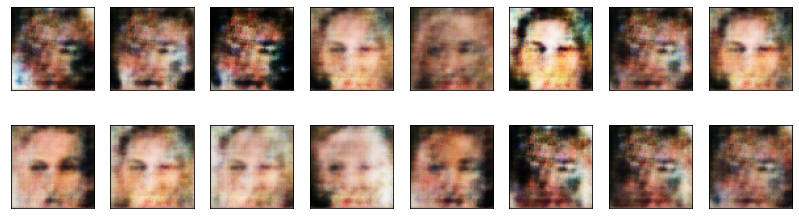

2025-03-29 14:09:22 | Epoch [12/30] | Batch 000/509 | d_loss: 01.8231 | g_loss: 0.5693
2025-03-29 14:09:30 | Epoch [12/30] | Batch 050/509 | d_loss: 02.0051 | g_loss: 0.5303
2025-03-29 14:09:39 | Epoch [12/30] | Batch 100/509 | d_loss: 01.8978 | g_loss: 0.4694
2025-03-29 14:09:47 | Epoch [12/30] | Batch 150/509 | d_loss: 01.9674 | g_loss: 0.6339
2025-03-29 14:09:56 | Epoch [12/30] | Batch 200/509 | d_loss: 01.8429 | g_loss: 0.5380
2025-03-29 14:10:04 | Epoch [12/30] | Batch 250/509 | d_loss: 02.2748 | g_loss: 0.8906
2025-03-29 14:10:12 | Epoch [12/30] | Batch 300/509 | d_loss: 01.7999 | g_loss: 0.5990
2025-03-29 14:10:21 | Epoch [12/30] | Batch 350/509 | d_loss: 01.7931 | g_loss: 0.5479
2025-03-29 14:10:29 | Epoch [12/30] | Batch 400/509 | d_loss: 01.9864 | g_loss: 0.5543
2025-03-29 14:10:37 | Epoch [12/30] | Batch 450/509 | d_loss: 02.2667 | g_loss: 0.4735
2025-03-29 14:10:46 | Epoch [12/30] | Batch 500/509 | d_loss: 01.9207 | g_loss: 0.5974


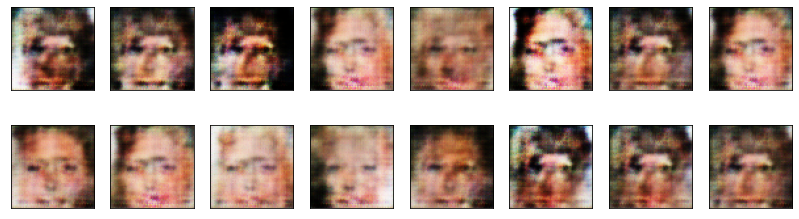

2025-03-29 14:10:51 | Epoch [13/30] | Batch 000/509 | d_loss: 02.0427 | g_loss: 0.6147
2025-03-29 14:11:00 | Epoch [13/30] | Batch 050/509 | d_loss: 01.8779 | g_loss: 0.5793
2025-03-29 14:11:08 | Epoch [13/30] | Batch 100/509 | d_loss: 02.1804 | g_loss: 0.5492
2025-03-29 14:11:16 | Epoch [13/30] | Batch 150/509 | d_loss: 01.9458 | g_loss: 0.6010
2025-03-29 14:11:25 | Epoch [13/30] | Batch 200/509 | d_loss: 01.8735 | g_loss: 0.6153
2025-03-29 14:11:33 | Epoch [13/30] | Batch 250/509 | d_loss: 01.7372 | g_loss: 0.5291
2025-03-29 14:11:42 | Epoch [13/30] | Batch 300/509 | d_loss: 01.6111 | g_loss: 0.8585
2025-03-29 14:11:50 | Epoch [13/30] | Batch 350/509 | d_loss: 01.8585 | g_loss: 0.4757
2025-03-29 14:11:58 | Epoch [13/30] | Batch 400/509 | d_loss: 01.8182 | g_loss: 0.5874
2025-03-29 14:12:07 | Epoch [13/30] | Batch 450/509 | d_loss: 01.8682 | g_loss: 0.5791
2025-03-29 14:12:15 | Epoch [13/30] | Batch 500/509 | d_loss: 01.8856 | g_loss: 0.4512


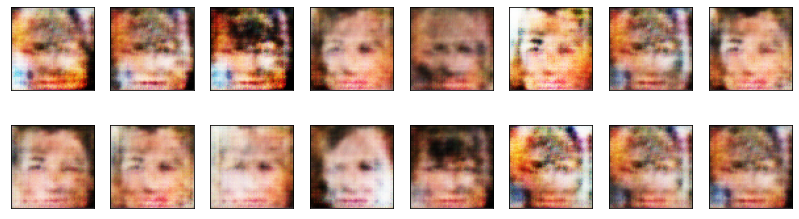

2025-03-29 14:12:20 | Epoch [14/30] | Batch 000/509 | d_loss: 11.3648 | g_loss: 1.1007
2025-03-29 14:12:28 | Epoch [14/30] | Batch 050/509 | d_loss: 01.9635 | g_loss: 0.4919
2025-03-29 14:12:37 | Epoch [14/30] | Batch 100/509 | d_loss: 01.7666 | g_loss: 0.5389
2025-03-29 14:12:45 | Epoch [14/30] | Batch 150/509 | d_loss: 01.8810 | g_loss: 0.5769
2025-03-29 14:12:53 | Epoch [14/30] | Batch 200/509 | d_loss: 01.9528 | g_loss: 0.5027
2025-03-29 14:13:02 | Epoch [14/30] | Batch 250/509 | d_loss: 01.8720 | g_loss: 0.4837
2025-03-29 14:13:10 | Epoch [14/30] | Batch 300/509 | d_loss: 01.7937 | g_loss: 0.4788
2025-03-29 14:13:19 | Epoch [14/30] | Batch 350/509 | d_loss: 01.8078 | g_loss: 0.5270
2025-03-29 14:13:27 | Epoch [14/30] | Batch 400/509 | d_loss: 01.8479 | g_loss: 0.4597
2025-03-29 14:13:35 | Epoch [14/30] | Batch 450/509 | d_loss: 01.8426 | g_loss: 0.5098
2025-03-29 14:13:44 | Epoch [14/30] | Batch 500/509 | d_loss: 01.9019 | g_loss: 0.5372


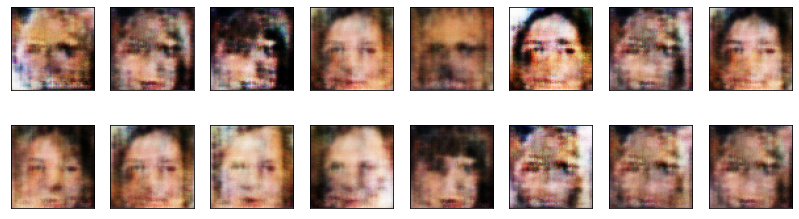

2025-03-29 14:13:49 | Epoch [15/30] | Batch 000/509 | d_loss: 01.8605 | g_loss: 0.5842
2025-03-29 14:13:57 | Epoch [15/30] | Batch 050/509 | d_loss: 01.8726 | g_loss: 0.5498
2025-03-29 14:14:06 | Epoch [15/30] | Batch 100/509 | d_loss: 01.8710 | g_loss: 0.5971
2025-03-29 14:14:14 | Epoch [15/30] | Batch 150/509 | d_loss: 01.8809 | g_loss: 0.6264
2025-03-29 14:14:23 | Epoch [15/30] | Batch 200/509 | d_loss: 01.8032 | g_loss: 0.5715
2025-03-29 14:14:31 | Epoch [15/30] | Batch 250/509 | d_loss: 01.8381 | g_loss: 0.5764
2025-03-29 14:14:39 | Epoch [15/30] | Batch 300/509 | d_loss: 01.8851 | g_loss: 0.4840
2025-03-29 14:14:48 | Epoch [15/30] | Batch 350/509 | d_loss: 02.0317 | g_loss: 0.5424
2025-03-29 14:14:56 | Epoch [15/30] | Batch 400/509 | d_loss: 01.7519 | g_loss: 0.5890
2025-03-29 14:15:04 | Epoch [15/30] | Batch 450/509 | d_loss: 01.7535 | g_loss: 0.5763
2025-03-29 14:15:13 | Epoch [15/30] | Batch 500/509 | d_loss: 01.7318 | g_loss: 0.5394


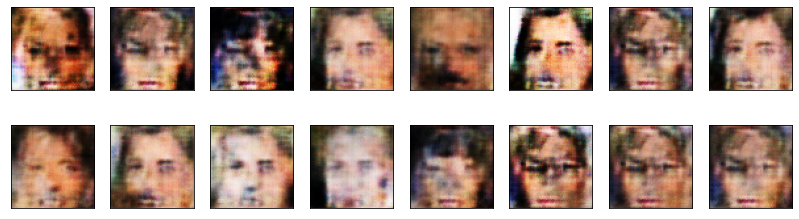

2025-03-29 14:15:18 | Epoch [16/30] | Batch 000/509 | d_loss: 01.8079 | g_loss: 0.4960
2025-03-29 14:15:26 | Epoch [16/30] | Batch 050/509 | d_loss: 01.7795 | g_loss: 0.6212
2025-03-29 14:15:35 | Epoch [16/30] | Batch 100/509 | d_loss: 01.8009 | g_loss: 0.5849
2025-03-29 14:15:43 | Epoch [16/30] | Batch 150/509 | d_loss: 01.6934 | g_loss: 0.7066
2025-03-29 14:15:51 | Epoch [16/30] | Batch 200/509 | d_loss: 01.7678 | g_loss: 0.6201
2025-03-29 14:16:00 | Epoch [16/30] | Batch 250/509 | d_loss: 01.7495 | g_loss: 0.6642
2025-03-29 14:16:08 | Epoch [16/30] | Batch 300/509 | d_loss: 01.7307 | g_loss: 0.6306
2025-03-29 14:16:16 | Epoch [16/30] | Batch 350/509 | d_loss: 01.8057 | g_loss: 0.5777
2025-03-29 14:16:25 | Epoch [16/30] | Batch 400/509 | d_loss: 01.7835 | g_loss: 0.5511
2025-03-29 14:16:33 | Epoch [16/30] | Batch 450/509 | d_loss: 01.8122 | g_loss: 0.5736
2025-03-29 14:16:41 | Epoch [16/30] | Batch 500/509 | d_loss: 01.7742 | g_loss: 0.6223


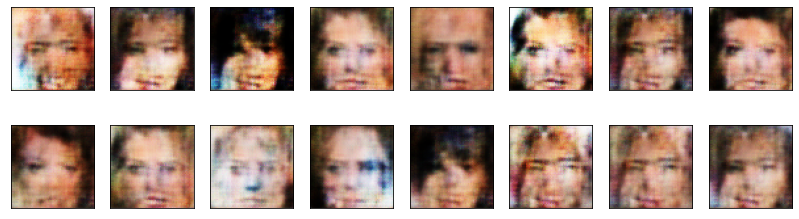

2025-03-29 14:16:47 | Epoch [17/30] | Batch 000/509 | d_loss: 01.7574 | g_loss: 0.5017
2025-03-29 14:16:55 | Epoch [17/30] | Batch 050/509 | d_loss: 50.4814 | g_loss: 6.1841
2025-03-29 14:17:04 | Epoch [17/30] | Batch 100/509 | d_loss: 01.7776 | g_loss: 0.6117
2025-03-29 14:17:12 | Epoch [17/30] | Batch 150/509 | d_loss: 01.5886 | g_loss: 0.6782
2025-03-29 14:17:21 | Epoch [17/30] | Batch 200/509 | d_loss: 01.6913 | g_loss: 0.6261
2025-03-29 14:17:29 | Epoch [17/30] | Batch 250/509 | d_loss: 01.6229 | g_loss: 0.6148
2025-03-29 14:17:37 | Epoch [17/30] | Batch 300/509 | d_loss: 01.6345 | g_loss: 0.6636
2025-03-29 14:17:46 | Epoch [17/30] | Batch 350/509 | d_loss: 01.6019 | g_loss: 0.5703
2025-03-29 14:17:54 | Epoch [17/30] | Batch 400/509 | d_loss: 01.7457 | g_loss: 0.6499
2025-03-29 14:18:03 | Epoch [17/30] | Batch 450/509 | d_loss: 01.7423 | g_loss: 0.5473
2025-03-29 14:18:11 | Epoch [17/30] | Batch 500/509 | d_loss: 01.6909 | g_loss: 0.6587


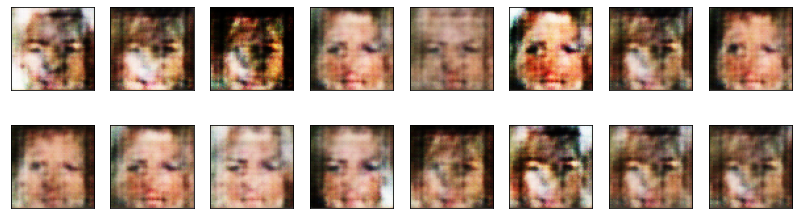

2025-03-29 14:18:15 | Epoch [18/30] | Batch 000/509 | d_loss: 01.6246 | g_loss: 0.6810
2025-03-29 14:18:24 | Epoch [18/30] | Batch 050/509 | d_loss: 01.6721 | g_loss: 0.5942
2025-03-29 14:18:32 | Epoch [18/30] | Batch 100/509 | d_loss: 01.6789 | g_loss: 0.6096
2025-03-29 14:18:41 | Epoch [18/30] | Batch 150/509 | d_loss: 01.7580 | g_loss: 0.6065
2025-03-29 14:18:49 | Epoch [18/30] | Batch 200/509 | d_loss: 01.7071 | g_loss: 0.6093
2025-03-29 14:18:57 | Epoch [18/30] | Batch 250/509 | d_loss: 01.6030 | g_loss: 0.6369
2025-03-29 14:19:06 | Epoch [18/30] | Batch 300/509 | d_loss: 01.7020 | g_loss: 0.5563
2025-03-29 14:19:14 | Epoch [18/30] | Batch 350/509 | d_loss: 01.7182 | g_loss: 0.5467
2025-03-29 14:19:23 | Epoch [18/30] | Batch 400/509 | d_loss: 01.6919 | g_loss: 0.7816
2025-03-29 14:19:31 | Epoch [18/30] | Batch 450/509 | d_loss: 01.6992 | g_loss: 0.5939
2025-03-29 14:19:39 | Epoch [18/30] | Batch 500/509 | d_loss: 01.6392 | g_loss: 0.6624


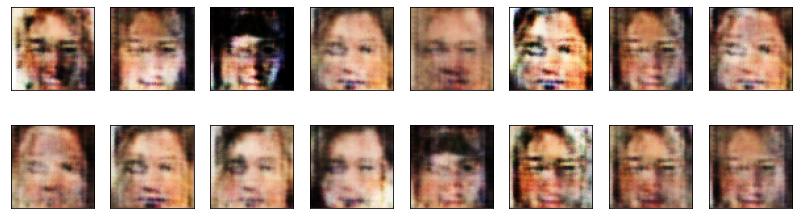

2025-03-29 14:19:44 | Epoch [19/30] | Batch 000/509 | d_loss: 01.6865 | g_loss: 0.5407
2025-03-29 14:19:53 | Epoch [19/30] | Batch 050/509 | d_loss: 01.8165 | g_loss: 0.4990
2025-03-29 14:20:01 | Epoch [19/30] | Batch 100/509 | d_loss: 01.6071 | g_loss: 0.5567
2025-03-29 14:20:09 | Epoch [19/30] | Batch 150/509 | d_loss: 01.6583 | g_loss: 0.6011
2025-03-29 14:20:18 | Epoch [19/30] | Batch 200/509 | d_loss: 01.7511 | g_loss: 0.5467
2025-03-29 14:20:26 | Epoch [19/30] | Batch 250/509 | d_loss: 01.7297 | g_loss: 0.5760
2025-03-29 14:20:34 | Epoch [19/30] | Batch 300/509 | d_loss: 01.6892 | g_loss: 0.6268
2025-03-29 14:20:43 | Epoch [19/30] | Batch 350/509 | d_loss: 01.7394 | g_loss: 0.6179
2025-03-29 14:20:51 | Epoch [19/30] | Batch 400/509 | d_loss: 01.7151 | g_loss: 0.5760
2025-03-29 14:20:59 | Epoch [19/30] | Batch 450/509 | d_loss: 01.6585 | g_loss: 0.5364
2025-03-29 14:21:08 | Epoch [19/30] | Batch 500/509 | d_loss: 01.6855 | g_loss: 0.6245


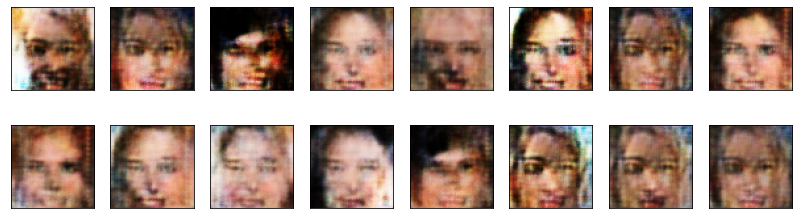

2025-03-29 14:21:13 | Epoch [20/30] | Batch 000/509 | d_loss: 01.7042 | g_loss: 0.6848
2025-03-29 14:21:21 | Epoch [20/30] | Batch 050/509 | d_loss: 01.6759 | g_loss: 0.5845
2025-03-29 14:21:30 | Epoch [20/30] | Batch 100/509 | d_loss: 01.6929 | g_loss: 0.6107
2025-03-29 14:21:38 | Epoch [20/30] | Batch 150/509 | d_loss: 01.7327 | g_loss: 0.5588
2025-03-29 14:21:47 | Epoch [20/30] | Batch 200/509 | d_loss: 01.6564 | g_loss: 0.7018
2025-03-29 14:21:55 | Epoch [20/30] | Batch 250/509 | d_loss: 01.7476 | g_loss: 0.5986
2025-03-29 14:22:03 | Epoch [20/30] | Batch 300/509 | d_loss: 01.7658 | g_loss: 0.5629
2025-03-29 14:22:12 | Epoch [20/30] | Batch 350/509 | d_loss: 01.6840 | g_loss: 0.5855
2025-03-29 14:22:20 | Epoch [20/30] | Batch 400/509 | d_loss: 01.7062 | g_loss: 0.6269
2025-03-29 14:22:28 | Epoch [20/30] | Batch 450/509 | d_loss: 01.7269 | g_loss: 0.6220
2025-03-29 14:22:37 | Epoch [20/30] | Batch 500/509 | d_loss: 01.7106 | g_loss: 0.6645


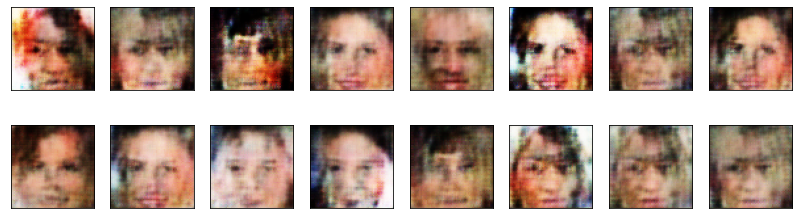

2025-03-29 14:22:42 | Epoch [21/30] | Batch 000/509 | d_loss: 01.6917 | g_loss: 0.5570
2025-03-29 14:22:50 | Epoch [21/30] | Batch 050/509 | d_loss: 01.6031 | g_loss: 0.5822
2025-03-29 14:22:59 | Epoch [21/30] | Batch 100/509 | d_loss: 01.7848 | g_loss: 0.6083
2025-03-29 14:23:07 | Epoch [21/30] | Batch 150/509 | d_loss: 01.6225 | g_loss: 0.6110
2025-03-29 14:23:15 | Epoch [21/30] | Batch 200/509 | d_loss: 01.6677 | g_loss: 0.5548
2025-03-29 14:23:24 | Epoch [21/30] | Batch 250/509 | d_loss: 01.6741 | g_loss: 0.6192
2025-03-29 14:23:32 | Epoch [21/30] | Batch 300/509 | d_loss: 01.6998 | g_loss: 0.5907
2025-03-29 14:23:41 | Epoch [21/30] | Batch 350/509 | d_loss: 01.6285 | g_loss: 0.5874
2025-03-29 14:23:49 | Epoch [21/30] | Batch 400/509 | d_loss: 01.6998 | g_loss: 0.6950
2025-03-29 14:23:57 | Epoch [21/30] | Batch 450/509 | d_loss: 01.6354 | g_loss: 0.5718
2025-03-29 14:24:06 | Epoch [21/30] | Batch 500/509 | d_loss: 01.6976 | g_loss: 0.6332


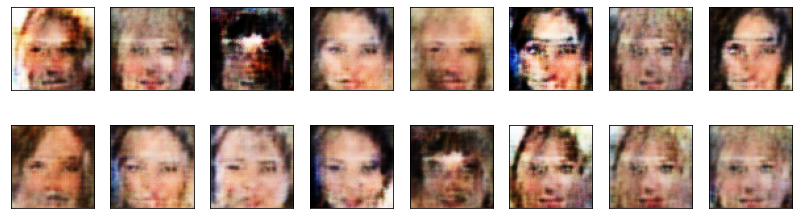

2025-03-29 14:24:10 | Epoch [22/30] | Batch 000/509 | d_loss: 01.7221 | g_loss: 0.5865
2025-03-29 14:24:19 | Epoch [22/30] | Batch 050/509 | d_loss: 01.7475 | g_loss: 0.5668
2025-03-29 14:24:27 | Epoch [22/30] | Batch 100/509 | d_loss: 01.6083 | g_loss: 0.6702
2025-03-29 14:24:35 | Epoch [22/30] | Batch 150/509 | d_loss: 01.5764 | g_loss: 0.6180
2025-03-29 14:24:44 | Epoch [22/30] | Batch 200/509 | d_loss: 01.6886 | g_loss: 0.6370
2025-03-29 14:24:52 | Epoch [22/30] | Batch 250/509 | d_loss: 01.6115 | g_loss: 0.5400
2025-03-29 14:25:00 | Epoch [22/30] | Batch 300/509 | d_loss: 01.7003 | g_loss: 0.6897
2025-03-29 14:25:09 | Epoch [22/30] | Batch 350/509 | d_loss: 01.6340 | g_loss: 0.6467
2025-03-29 14:25:17 | Epoch [22/30] | Batch 400/509 | d_loss: 01.6333 | g_loss: 0.6511
2025-03-29 14:25:25 | Epoch [22/30] | Batch 450/509 | d_loss: 01.6653 | g_loss: 0.6791
2025-03-29 14:25:34 | Epoch [22/30] | Batch 500/509 | d_loss: 01.6021 | g_loss: 0.5679


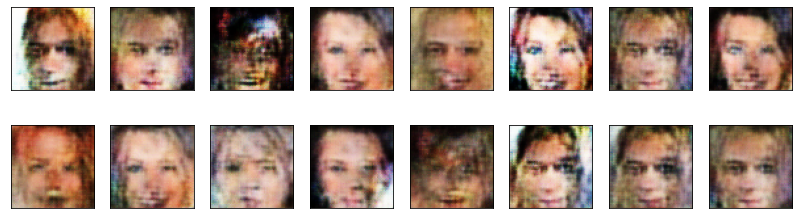

2025-03-29 14:25:39 | Epoch [23/30] | Batch 000/509 | d_loss: 01.6083 | g_loss: 0.5907
2025-03-29 14:25:47 | Epoch [23/30] | Batch 050/509 | d_loss: 01.5773 | g_loss: 0.7131
2025-03-29 14:25:55 | Epoch [23/30] | Batch 100/509 | d_loss: 01.6626 | g_loss: 0.6408
2025-03-29 14:26:04 | Epoch [23/30] | Batch 150/509 | d_loss: 01.6225 | g_loss: 0.6426
2025-03-29 14:26:12 | Epoch [23/30] | Batch 200/509 | d_loss: 01.5928 | g_loss: 0.7973
2025-03-29 14:26:21 | Epoch [23/30] | Batch 250/509 | d_loss: 01.5544 | g_loss: 0.5538
2025-03-29 14:26:29 | Epoch [23/30] | Batch 300/509 | d_loss: 01.3442 | g_loss: 0.9800
2025-03-29 14:26:38 | Epoch [23/30] | Batch 350/509 | d_loss: 01.4580 | g_loss: 0.5958
2025-03-29 14:26:46 | Epoch [23/30] | Batch 400/509 | d_loss: 01.4642 | g_loss: 0.7496
2025-03-29 14:26:54 | Epoch [23/30] | Batch 450/509 | d_loss: 01.4364 | g_loss: 0.7571
2025-03-29 14:27:03 | Epoch [23/30] | Batch 500/509 | d_loss: 01.4768 | g_loss: 0.6633


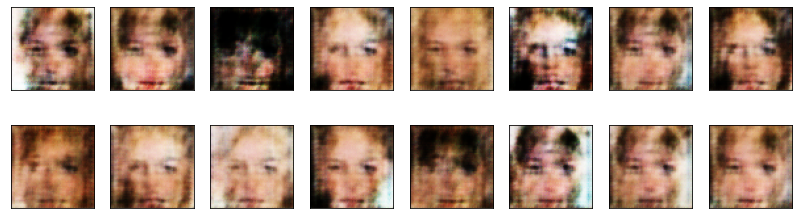

2025-03-29 14:27:09 | Epoch [24/30] | Batch 000/509 | d_loss: 01.5583 | g_loss: 0.6327
2025-03-29 14:27:17 | Epoch [24/30] | Batch 050/509 | d_loss: 01.4268 | g_loss: 0.7892
2025-03-29 14:27:26 | Epoch [24/30] | Batch 100/509 | d_loss: 01.5720 | g_loss: 0.6607
2025-03-29 14:27:34 | Epoch [24/30] | Batch 150/509 | d_loss: 01.5252 | g_loss: 0.6610
2025-03-29 14:27:43 | Epoch [24/30] | Batch 200/509 | d_loss: 01.5557 | g_loss: 0.5851
2025-03-29 14:27:51 | Epoch [24/30] | Batch 250/509 | d_loss: 01.5949 | g_loss: 0.6474
2025-03-29 14:27:59 | Epoch [24/30] | Batch 300/509 | d_loss: 01.5918 | g_loss: 0.6646
2025-03-29 14:28:08 | Epoch [24/30] | Batch 350/509 | d_loss: 01.6022 | g_loss: 0.6212
2025-03-29 14:28:16 | Epoch [24/30] | Batch 400/509 | d_loss: 01.5788 | g_loss: 0.5779
2025-03-29 14:28:24 | Epoch [24/30] | Batch 450/509 | d_loss: 01.6344 | g_loss: 0.6376
2025-03-29 14:28:33 | Epoch [24/30] | Batch 500/509 | d_loss: 01.5838 | g_loss: 0.6626


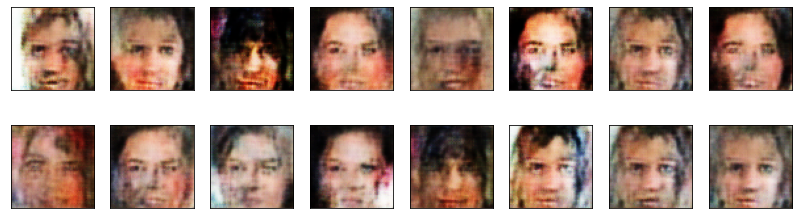

2025-03-29 14:28:39 | Epoch [25/30] | Batch 000/509 | d_loss: 01.6038 | g_loss: 0.6974
2025-03-29 14:28:47 | Epoch [25/30] | Batch 050/509 | d_loss: 01.5735 | g_loss: 0.6282
2025-03-29 14:28:55 | Epoch [25/30] | Batch 100/509 | d_loss: 01.5984 | g_loss: 0.6814
2025-03-29 14:29:04 | Epoch [25/30] | Batch 150/509 | d_loss: 01.6193 | g_loss: 0.5414
2025-03-29 14:29:12 | Epoch [25/30] | Batch 200/509 | d_loss: 01.6256 | g_loss: 0.7192
2025-03-29 14:29:21 | Epoch [25/30] | Batch 250/509 | d_loss: 01.6339 | g_loss: 0.6424
2025-03-29 14:29:29 | Epoch [25/30] | Batch 300/509 | d_loss: 01.5742 | g_loss: 0.6006
2025-03-29 14:29:37 | Epoch [25/30] | Batch 350/509 | d_loss: 01.6844 | g_loss: 0.7198
2025-03-29 14:29:46 | Epoch [25/30] | Batch 400/509 | d_loss: 01.5289 | g_loss: 0.7518
2025-03-29 14:29:54 | Epoch [25/30] | Batch 450/509 | d_loss: 01.5649 | g_loss: 0.6459
2025-03-29 14:30:02 | Epoch [25/30] | Batch 500/509 | d_loss: 01.7213 | g_loss: 0.7514


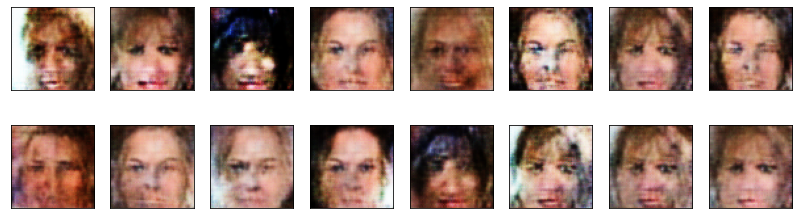

2025-03-29 14:30:08 | Epoch [26/30] | Batch 000/509 | d_loss: 01.5605 | g_loss: 0.7269
2025-03-29 14:30:16 | Epoch [26/30] | Batch 050/509 | d_loss: 01.6152 | g_loss: 0.6404
2025-03-29 14:30:25 | Epoch [26/30] | Batch 100/509 | d_loss: 01.5734 | g_loss: 0.6552
2025-03-29 14:30:33 | Epoch [26/30] | Batch 150/509 | d_loss: 01.5565 | g_loss: 0.5909
2025-03-29 14:30:42 | Epoch [26/30] | Batch 200/509 | d_loss: 01.9555 | g_loss: 0.8201
2025-03-29 14:30:50 | Epoch [26/30] | Batch 250/509 | d_loss: 01.6153 | g_loss: 0.5457
2025-03-29 14:30:58 | Epoch [26/30] | Batch 300/509 | d_loss: 01.5671 | g_loss: 0.5428
2025-03-29 14:31:07 | Epoch [26/30] | Batch 350/509 | d_loss: 01.5613 | g_loss: 0.6152
2025-03-29 14:31:15 | Epoch [26/30] | Batch 400/509 | d_loss: 01.5614 | g_loss: 0.6799
2025-03-29 14:31:24 | Epoch [26/30] | Batch 450/509 | d_loss: 01.5164 | g_loss: 0.6813
2025-03-29 14:31:32 | Epoch [26/30] | Batch 500/509 | d_loss: 01.5622 | g_loss: 0.6154


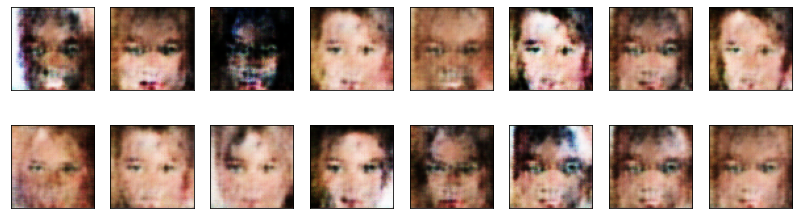

2025-03-29 14:31:36 | Epoch [27/30] | Batch 000/509 | d_loss: 01.6000 | g_loss: 0.6456
2025-03-29 14:31:44 | Epoch [27/30] | Batch 050/509 | d_loss: 01.5998 | g_loss: 0.6219
2025-03-29 14:31:53 | Epoch [27/30] | Batch 100/509 | d_loss: 01.4723 | g_loss: 0.6785
2025-03-29 14:32:01 | Epoch [27/30] | Batch 150/509 | d_loss: 01.5197 | g_loss: 0.6644
2025-03-29 14:32:10 | Epoch [27/30] | Batch 200/509 | d_loss: 01.6448 | g_loss: 0.7932
2025-03-29 14:32:18 | Epoch [27/30] | Batch 250/509 | d_loss: 01.5905 | g_loss: 0.5850
2025-03-29 14:32:26 | Epoch [27/30] | Batch 300/509 | d_loss: 01.4762 | g_loss: 0.6848
2025-03-29 14:32:35 | Epoch [27/30] | Batch 350/509 | d_loss: 01.6066 | g_loss: 0.6336
2025-03-29 14:32:43 | Epoch [27/30] | Batch 400/509 | d_loss: 01.5405 | g_loss: 0.6848
2025-03-29 14:32:51 | Epoch [27/30] | Batch 450/509 | d_loss: 01.5514 | g_loss: 0.6457
2025-03-29 14:33:00 | Epoch [27/30] | Batch 500/509 | d_loss: 01.5520 | g_loss: 0.6814


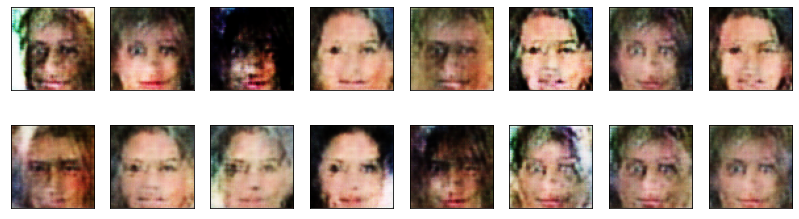

2025-03-29 14:33:06 | Epoch [28/30] | Batch 000/509 | d_loss: 01.5680 | g_loss: 0.6124
2025-03-29 14:33:14 | Epoch [28/30] | Batch 050/509 | d_loss: 01.5983 | g_loss: 0.6458
2025-03-29 14:33:22 | Epoch [28/30] | Batch 100/509 | d_loss: 01.4999 | g_loss: 0.6115
2025-03-29 14:33:31 | Epoch [28/30] | Batch 150/509 | d_loss: 01.5975 | g_loss: 0.6860
2025-03-29 14:33:39 | Epoch [28/30] | Batch 200/509 | d_loss: 01.6393 | g_loss: 0.6549
2025-03-29 14:33:47 | Epoch [28/30] | Batch 250/509 | d_loss: 01.5713 | g_loss: 0.6385
2025-03-29 14:33:56 | Epoch [28/30] | Batch 300/509 | d_loss: 01.5441 | g_loss: 0.6074
2025-03-29 14:34:04 | Epoch [28/30] | Batch 350/509 | d_loss: 01.5863 | g_loss: 0.7082
2025-03-29 14:34:12 | Epoch [28/30] | Batch 400/509 | d_loss: 01.5923 | g_loss: 0.6769
2025-03-29 14:34:21 | Epoch [28/30] | Batch 450/509 | d_loss: 01.5840 | g_loss: 0.6701
2025-03-29 14:34:29 | Epoch [28/30] | Batch 500/509 | d_loss: 01.5635 | g_loss: 0.6060


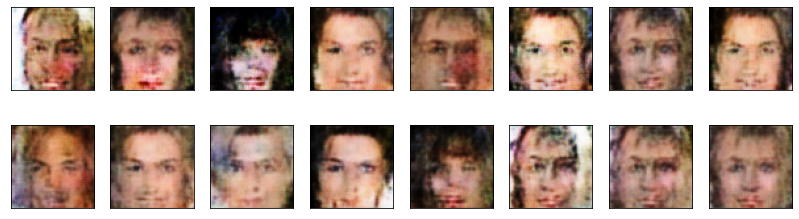

2025-03-29 14:34:34 | Epoch [29/30] | Batch 000/509 | d_loss: 01.5457 | g_loss: 0.6236
2025-03-29 14:34:42 | Epoch [29/30] | Batch 050/509 | d_loss: 01.5207 | g_loss: 0.7294
2025-03-29 14:34:51 | Epoch [29/30] | Batch 100/509 | d_loss: 01.5918 | g_loss: 0.6657
2025-03-29 14:34:59 | Epoch [29/30] | Batch 150/509 | d_loss: 01.5538 | g_loss: 0.6563
2025-03-29 14:35:07 | Epoch [29/30] | Batch 200/509 | d_loss: 01.6009 | g_loss: 0.6369
2025-03-29 14:35:16 | Epoch [29/30] | Batch 250/509 | d_loss: 01.5478 | g_loss: 0.5680
2025-03-29 14:35:24 | Epoch [29/30] | Batch 300/509 | d_loss: 01.5449 | g_loss: 0.5628
2025-03-29 14:35:32 | Epoch [29/30] | Batch 350/509 | d_loss: 01.5421 | g_loss: 0.6818
2025-03-29 14:35:41 | Epoch [29/30] | Batch 400/509 | d_loss: 01.5936 | g_loss: 0.5996
2025-03-29 14:35:49 | Epoch [29/30] | Batch 450/509 | d_loss: 01.5121 | g_loss: 0.6162
2025-03-29 14:35:58 | Epoch [29/30] | Batch 500/509 | d_loss: 01.6172 | g_loss: 0.6019


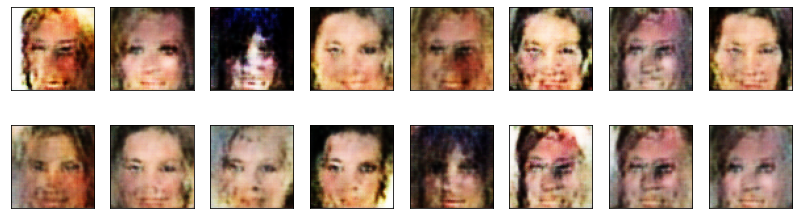

2025-03-29 14:36:03 | Epoch [30/30] | Batch 000/509 | d_loss: 01.6301 | g_loss: 0.7418
2025-03-29 14:36:11 | Epoch [30/30] | Batch 050/509 | d_loss: 01.5714 | g_loss: 0.5700
2025-03-29 14:36:20 | Epoch [30/30] | Batch 100/509 | d_loss: 01.5627 | g_loss: 0.6958
2025-03-29 14:36:28 | Epoch [30/30] | Batch 150/509 | d_loss: 01.5317 | g_loss: 0.7114
2025-03-29 14:36:36 | Epoch [30/30] | Batch 200/509 | d_loss: 01.4799 | g_loss: 0.6757
2025-03-29 14:36:45 | Epoch [30/30] | Batch 250/509 | d_loss: 01.5707 | g_loss: 0.6533
2025-03-29 14:36:53 | Epoch [30/30] | Batch 300/509 | d_loss: 01.5285 | g_loss: 0.6815
2025-03-29 14:37:02 | Epoch [30/30] | Batch 350/509 | d_loss: 01.4946 | g_loss: 0.6463
2025-03-29 14:37:10 | Epoch [30/30] | Batch 400/509 | d_loss: 01.5329 | g_loss: 0.6333
2025-03-29 14:37:18 | Epoch [30/30] | Batch 450/509 | d_loss: 01.4398 | g_loss: 0.6535
2025-03-29 14:37:27 | Epoch [30/30] | Batch 500/509 | d_loss: 01.4879 | g_loss: 0.6428


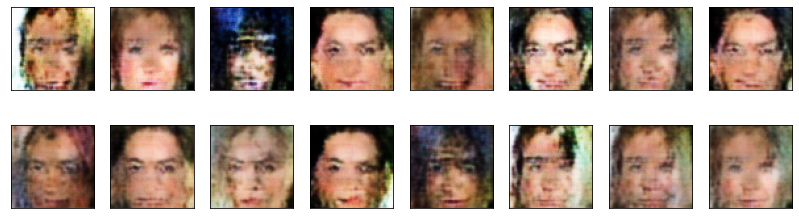

In [25]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        
        # Dynamically determine the batch size from real_images
        current_batch_size = real_images.size(0)

        ####################################

        # Train the discriminator
        d_loss = discriminator_step(current_batch_size, latent_dim, real_images)

        # Train the generator more often than the discriminator
        for _ in range(2):  # Train generator twice for every discriminator step
            g_loss = generator_step(current_batch_size, latent_dim)
        
        ####################################
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1:02d}/{n_epochs}] | Batch {batch_i:03d}/{len(dataloader)} | d_loss: {d:07.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

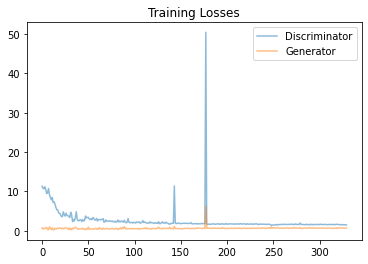

In [26]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

<font color="red"> 

**Answer:** Generative models try to capture the probability distribution of $X$, sometimes but not all the time has given that class $Y$. As the dataset mostly consists of faces of white celebrities that has high probability distribution, GANs has generated images that belong to white faces. Experimentation of different model sizes (32 $\rightarrow$ 64 $\rightarrow$ 128) has been made and it is observed that with 128 more features has captured. `Adam` has been chosen as the primary optimizer choice for this task as it is widely used in the literature for GANs and the model may be run for a few epochs more but with more epochs experimentation it is observed that although discriminator loss gets over 100, generator loss gets close to 0 which need further research and experimentation."

</font>

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.